# Code

In [1]:
import numpy as np
import pandas as pd
import pandas_profiling as pp
from pycaret.classification import setup, compare_models, plot_model, create_model, tune_model, predict_model, stack_models, save_model, load_model
from sklearn.metrics import accuracy_score
from plotnine import *
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
from sklearn import model_selection
from tqdm import tqdm

import warnings
warnings.simplefilter('ignore', FutureWarning)
warnings.simplefilter('ignore', UserWarning)

## Data Cleaning

In [2]:
train = pd.read_csv('Data/train.csv')
test = pd.read_csv('Data/test.csv')
sample = pd.read_csv('Data/sample_submission.csv')
neighbourhood = pd.read_excel('Data/neighbourhood.xlsx')

In [3]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9681 entries, 0 to 9680
Data columns (total 25 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                9681 non-null   int64  
 1   neighbourhood                     9681 non-null   object 
 2   room_type                         9681 non-null   object 
 3   minimum_nights                    9681 non-null   int64  
 4   number_of_reviews                 9681 non-null   int64  
 5   last_review                       9681 non-null   object 
 6   reviews_per_month                 9681 non-null   float64
 7   calculated_host_listings_count    9681 non-null   int64  
 8   availability_365                  9681 non-null   int64  
 9   host_since                        9681 non-null   object 
 10  host_is_superhost                 9681 non-null   object 
 11  bathrooms                         9681 non-null   float64
 12  bedroo

In [4]:
pp.ProfileReport(train)

In [5]:
# id is primary key, cannot use
# neighbourhood has 45 distinct values, can use external data to extract information
# last_review and host_since are date variable, can combine them to get a variable to indicate experience
# is_business_travel_ready contains the same value and is invalid variable
# density makes more sense than Population and Area to indicate popularity of certain areas
# cancellation_policy can be changed to continuous variable to indicate the relaxation level of policy

# train
train['host_duration'] = (pd.to_datetime(train['last_review']) - pd.to_datetime(train['host_since'])).dt.days
train = pd.merge(train, neighbourhood, left_on = 'neighbourhood', right_on = 'Name').drop(['neighbourhood', 'Name'], axis = 1)
train['density'] = train['Population']/train['Area in km2']
train = train.drop(['id', 'is_business_travel_ready', 'last_review', 'host_since', 'Population', 'Area in km2'], axis = 1)
train.replace({'flexible': 4, 'moderate': 3, 'strict_14_with_grace_period': 2, 'super_strict_30': 1, 
               'super_strict_60': 0}, inplace = True)

# test
test['host_duration'] = (pd.to_datetime(test['last_review']) - pd.to_datetime(test['host_since'])).dt.days
test = pd.merge(test, neighbourhood, left_on = 'neighbourhood', right_on = 'Name').drop(['neighbourhood', 'Name'], axis = 1)
test['density'] = test['Population']/test['Area in km2']
test = test.drop(['is_business_travel_ready', 'last_review', 'host_since', 'Population', 'Area in km2'], axis = 1)
test.replace({'flexible': 4, 'moderate': 3, 'strict_14_with_grace_period': 2, 'super_strict_30': 1,
              'super_strict_60': 0}, inplace = True)

In [6]:
cat = ['room_type', 'host_is_superhost', 'bed_type', 'instant_bookable', 'require_guest_profile_picture',
       'require_guest_phone_verification']
num = ['minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365',
       'bathrooms', 'bedrooms', 'beds', 'cleaning_fee', 'guests_included', 'extra_people', 'maximum_nights', 'density',
       'Commune', 'cancellation_policy', 'host_duration']

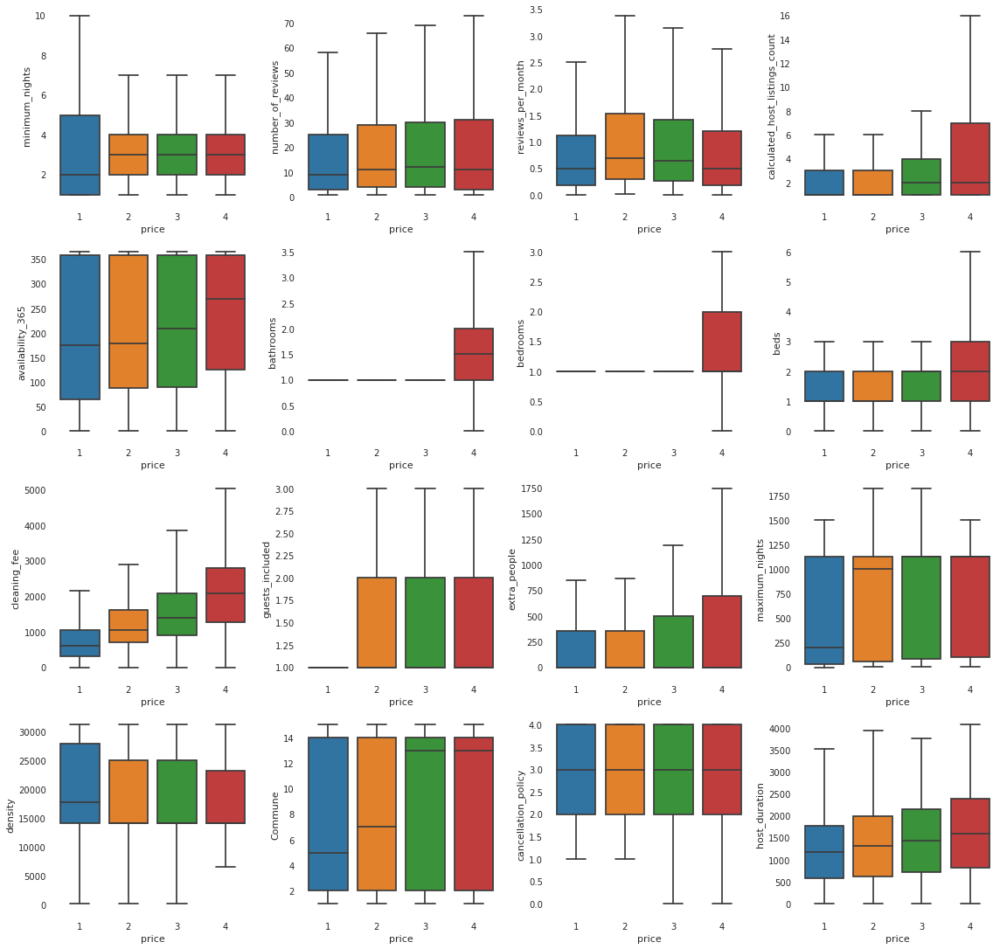

In [7]:
fig = plt.figure(figsize = (16,16))
for i in range(len(num)):
    sns.boxplot(data = train, x = 'price', y = num[i], ax = fig.add_subplot(4,4,i+1), showfliers = False)
# fig.suptitle('Plots of Continuous Predictors versus Price', fontsize = 16)
plt.tight_layout(rect=[0, 0.03, 1, 0.98])

In [8]:
for i in cat:
    p = (ggplot(data = train) +
         geom_count(mapping = aes(x = 'price', y = i)) +
         theme_light(base_size = 15))
    ggsave(p, filename = 'test_' + i + '.png')

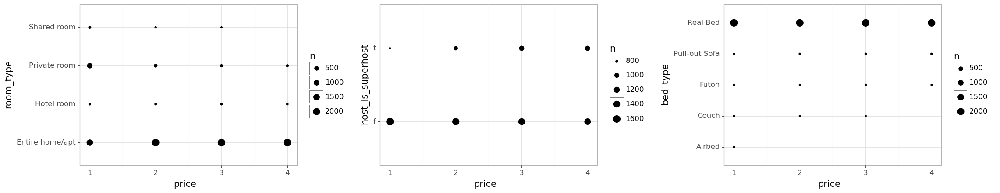

In [9]:
images = [Image.open(x) for x in ['test_' + i + '.png' for i in cat]]

widths, heights = zip(*(i.size for i in images))

sum_width = sum(widths[:3])
max_height = max(heights[:3])

new_im = Image.new('RGB', (sum_width, max_height))

x_offset = 0
for im in images[:3]:
    new_im.paste(im, (x_offset,0))
    x_offset += im.size[0]
new_im

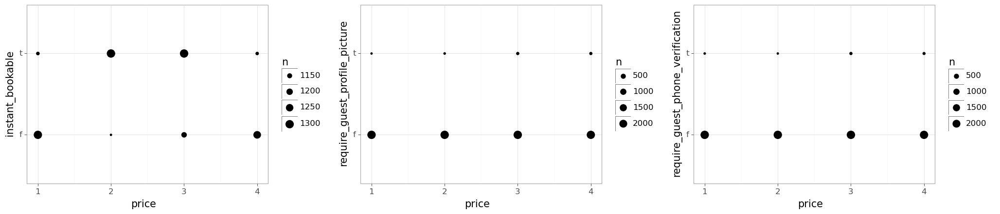

In [10]:
sum_width = sum(widths[3:])
max_height = max(heights[3:])

new_im = Image.new('RGB', (sum_width, max_height))

x_offset = 0
for im in images[3:]:
    new_im.paste(im, (x_offset,0))
    x_offset += im.size[0]
new_im

In [11]:
# check if there is any disparity between training set and test set
for i in cat:
    print(i, ':', list(set(test[i])) == list(set(train[i])))

room_type : True
host_is_superhost : True
bed_type : False
instant_bookable : True
require_guest_profile_picture : True
require_guest_phone_verification : True


In [12]:
# together with pp figure, should drop bed_type
# train
train.drop('bed_type', axis = 1, inplace = True)
train = pd.get_dummies(train, 
                       columns = ['room_type', 'host_is_superhost', 'instant_bookable', 'require_guest_profile_picture', 'require_guest_phone_verification'],
                       drop_first = True)

# test
test.drop('bed_type', axis = 1, inplace = True)
test = pd.get_dummies(test, 
                      columns = ['room_type', 'host_is_superhost', 'instant_bookable', 'require_guest_profile_picture', 'require_guest_phone_verification'],
                      drop_first = True)


## Model Selection

In [13]:
clfs = setup(
    data = train,
    target = 'price',
    silent = True,
    session_id = 1
)

Setup Succesfully Completed!


,Description,Value
0,session_id,1
1,Target Type,Multiclass
2,Label Encoded,None
3,Original Data,"(9681, 24)"
4,Missing Values,False
5,Numeric Features,18
6,Categorical Features,5
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


In [14]:
best_model = compare_models(sort = 'Accuracy')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
0,Light Gradient Boosting Machine,0.5415,0.0000,0.5425,0.5397,0.5400,0.3886,0.3888,1.0356
1,CatBoost Classifier,0.5401,0.0000,0.5410,0.5408,0.5399,0.3868,0.3870,13.7450
2,Extreme Gradient Boosting,0.5363,0.0000,0.5373,0.5353,0.5353,0.3817,0.3820,7.6378
3,Gradient Boosting Classifier,0.5242,0.0000,0.5250,0.5246,0.5237,0.3655,0.3658,5.3062
4,Ada Boost Classifier,0.5077,0.0000,0.5088,0.4999,0.5024,0.3436,0.3442,1.6393
5,Random Forest Classifier,0.5072,0.0000,0.5083,0.5048,0.5042,0.3430,0.3439,0.5682
6,Extra Trees Classifier,0.5049,0.0000,0.5059,0.5048,0.5044,0.3398,0.3400,1.3684
7,Ridge Classifier,0.4787,0.0000,0.4797,0.4855,0.4808,0.3049,0.3054,0.0579
8,Linear Discriminant Analysis,0.4752,0.0000,0.4758,0.5011,0.4827,0.3000,0.3019,0.2740
9,Naive Bayes,0.4414,0.0000,0.4431,0.4954,0.4279,0.2557,0.2807,0.0354


## Running Time

In [15]:
%%time

clf = LGBMClassifier()
pred = clf.fit(train.drop('price', axis = 1), train['price']).predict(test.drop('id', axis = 1))

CPU times: user 1.48 s, sys: 32 ms, total: 1.52 s
Wall time: 1.51 s


In [16]:
%%time

clf = RandomForestClassifier()
pred = clf.fit(train.drop('price', axis = 1), train['price']).predict(test.drop('id', axis = 1))

CPU times: user 1.55 s, sys: 16 ms, total: 1.57 s
Wall time: 1.57 s


## Hyperparameter Tuning

### Light Gradient Boosting Machine

In [17]:
kfold = model_selection.KFold(
    n_splits = 5, 
    shuffle = True,
    random_state = 10
)
store1 = np.zeros((5, 8))
p1s = [0.001, 0.01, 0.1, 1, 10]
p2s = [50, 100, 150, 200, 250, 300, 350, 400]
with tqdm(total=40) as pbar:
    for i in range(len(p1s)):
        for j in range(len(p2s)):
            clf = LGBMClassifier(n_jobs = -1, random_state = 10, learning_rate = p1s[i], n_estimators = p2s[j])
            s = model_selection.cross_val_score(
                clf, train.drop('price', axis = 1), train['price'], scoring='accuracy', cv=kfold,
            )
            store1[i,j] = np.mean(s)
            pbar.update(1)

100%|██████████| 40/40 [07:40<00:00, 11.51s/it]


In [18]:
print('Best learning rate:', float(np.array(p1s)[np.where(store1 == store1.max())[0]]))
print('Best number of trees:', int(np.array(p2s)[np.where(store1 == store1.max())[1]]))

Best learning rate: 0.1
Best number of trees: 400


### Random Forest

In [19]:
store2 = np.zeros((5, 8))
p1s2 = [0.1, 'log2', 'sqrt', 0.3, 0.5]
p2s2 = [50, 100, 150, 200, 250, 300, 350, 400]
with tqdm(total=40) as pbar:
    for i in range(len(p1s2)):
        for j in range(len(p2s2)):
            clf = RandomForestClassifier(n_jobs = -1, random_state = 10, max_features = p1s2[i], n_estimators = p2s2[j])
            s = model_selection.cross_val_score(
                clf, train.drop('price', axis = 1), train['price'], scoring='accuracy', cv=kfold,
            )
            store2[i,j] = np.mean(s)
            pbar.update(1)

100%|██████████| 40/40 [03:01<00:00,  4.54s/it]


In [20]:
index = np.array(np.where(store2 == store2.max()))[:,0]
print('Best number of features:', np.array(p1s2)[index[0]])
print('Best number of trees:', int(np.array(p2s2)[index[1]]))

Best number of features: log2
Best number of trees: 300


### Figure

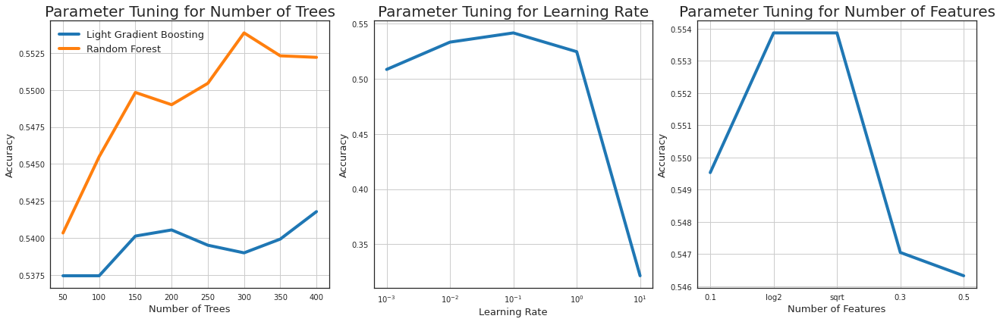

In [21]:
with plt.style.context("seaborn-whitegrid"):
    plt.rcParams["axes.edgecolor"] = "0.15"
    plt.rcParams["axes.linewidth"]  = 1.25
    
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    axs = axs.ravel()

    accuracy11 = store1[np.where(store1 == store1.max())[0]]
    accuracy12 = store2[index[0]]
    accuracy2 = store1[:,np.where(store1 == store1.max())[1]]
    accuracy3 = store2[:,index[1]]

    axs[0].plot(p2s, accuracy11.reshape(-1), '-', linewidth=4.0, label='Light Gradient Boosting')
    axs[0].plot(p2s2, accuracy12, '-', linewidth=4.0, label='Random Forest')
    axs[0].set_title('Parameter Tuning for Number of Trees', size = 20)
    axs[0].set_xlabel('Number of Trees', size = 13)
    axs[0].set_ylabel('Accuracy', size = 13)
    axs[0].legend(loc='best', prop={'size':13})

    axs[1].set_xscale('log')
    axs[1].plot(p1s, accuracy2.reshape(-1), '-', linewidth=4.0, )
    axs[1].set_title('Parameter Tuning for Learning Rate', size = 20)
    axs[1].set_xlabel('Learning Rate', size = 13)
    axs[1].set_ylabel('Accuracy', size = 13)

    axs[2].plot(p1s2, accuracy3.reshape(-1), '-', linewidth=4.0, )
    axs[2].set_title('Parameter Tuning for Number of Features', size = 20)
    axs[2].set_xlabel('Number of Features', size = 13)
    axs[2].set_ylabel('Accuracy', size = 13)

    plt.tight_layout()

## Cross Validation

In [22]:
clf_lgb = LGBMClassifier(n_jobs = -1, random_state = 10, learning_rate = 0.1, n_estimators = 400)
clf_rf = RandomForestClassifier(n_jobs = -1, random_state = 10, max_features = 'log2', n_estimators = 300)
kfold = model_selection.KFold(
    n_splits = 5, 
    shuffle = True,
    random_state = 10
)
s_lgb = model_selection.cross_val_score(
    clf_lgb, train.drop('price', axis = 1), train['price'], scoring='accuracy', cv=kfold)
s_rf = model_selection.cross_val_score(
    clf_rf, train.drop('price', axis = 1), train['price'], scoring='accuracy', cv=kfold)

In [23]:
np.round(s_lgb, 3)

array([0.559, 0.533, 0.528, 0.535, 0.554])

In [24]:
np.round(s_rf, 3)

array([0.569, 0.555, 0.55 , 0.536, 0.56 ])

## Submission

In [25]:
clf_lgb = LGBMClassifier(n_jobs = -1, learning_rate = 0.1, n_estimators = 400)
clf_rf = RandomForestClassifier(n_jobs = -1, max_features = 'log2', n_estimators = 300)
pred_lgb = clf_lgb.fit(train.drop('price', axis = 1), train['price']).predict(test.drop('id', axis = 1))
pred_rf = clf_rf.fit(train.drop('price', axis = 1), train['price']).predict(test.drop('id', axis = 1))

In [26]:
index = [test['id'].to_list().index(i) for i in sample['id']]
sample['price'] = pred_lgb[index]
sample.to_csv('lgb_submission.csv', index = False)

sample['price'] = pred_rf[index]
sample.to_csv('rf_submission.csv', index = False)

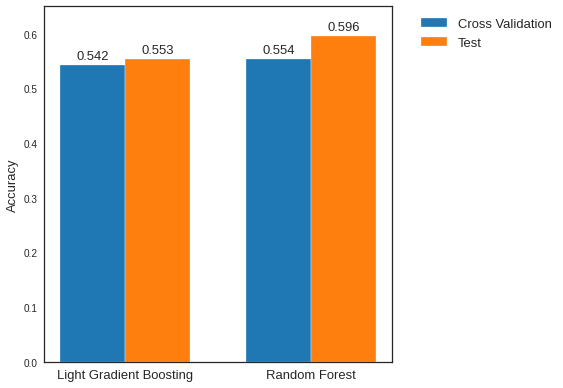

In [27]:
# reference: https://matplotlib.org/3.1.1/gallery/lines_bars_and_markers/barchart.html#sphx-glr-gallery-lines-bars-and-markers-barchart-py
labels = ['Light Gradient Boosting', 'Random Forest']
cv_means = np.round([np.mean(s_lgb), np.mean(s_rf)], 3)
test_means = [0.553, 0.596]

x = np.arange(len(labels))
width = 0.35

with plt.style.context("seaborn-white"):
    plt.rcParams["axes.edgecolor"] = "0.15"
    plt.rcParams["axes.linewidth"]  = 1.25
    
    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width/2, cv_means, width, label='Cross Validation')
    rects2 = ax.bar(x + width/2, test_means, width, label='Test')

    ax.set_ylabel('Accuracy', size = 13)
    ax.set_xticks(x)
    ax.set_ylim([0,0.65])
    ax.set_xticklabels(labels, size = 13)
    ax.legend(bbox_to_anchor=(1.05, 1), prop={'size':13})


    def autolabel(rects):
        """Attach a text label above each bar in *rects*, displaying its height."""
        for rect in rects:
            height = rect.get_height()
            ax.annotate('{}'.format(height),
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom',
                        size = 13)

    autolabel(rects1)
    autolabel(rects2)
    fig.tight_layout()

    plt.show()

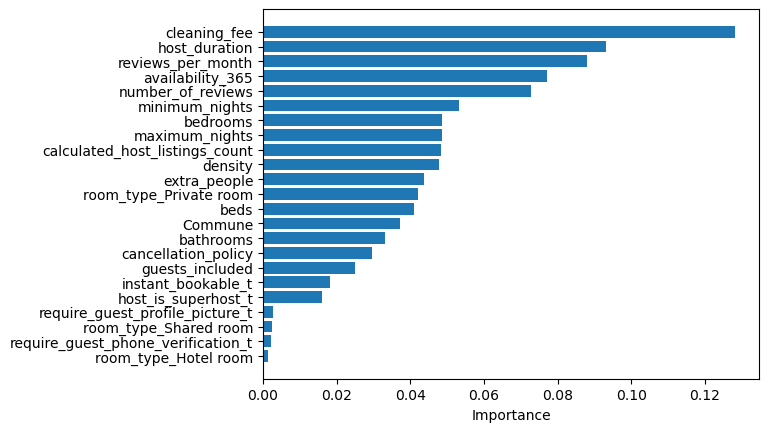

In [28]:
# reference: https://matplotlib.org/3.1.1/gallery/lines_bars_and_markers/barh.html
df_importance = (
    pd.DataFrame(dict(feature = train.drop('price', axis = 1).columns,
                      importance = clf_rf.feature_importances_)).
    sort_values('importance', ascending = False).
    reset_index(drop = True)
)

plt.rcdefaults()
fig, ax = plt.subplots()

# Example data
people = df_importance['feature']
y_pos = np.arange(len(people))
performance = df_importance['importance']

ax.barh(y_pos, performance)
ax.set_yticks(y_pos)
ax.set_yticklabels(people)
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Importance')
ax.set_title('')

plt.show()